# DATOS

Aprovechamos que ya sabemos que:

+ Respecto a la **Segmentación de Hoteles** queremos que se distingan únicamente Luxury y Rest. Esta distinción se hará a través del Hotel Brand, donde Luxury será Anantara+Tivoli y Rest será el resto de marcas. 
+ Para la **Segmentación de Canal** debemos distinguir entre Web, Booking y Rest OTAs (Web = DIR-Web B2C + DIR-CRO Web B2C + DIR-Web B2B // Booking = IND-Booking // Rest OTAs = IND-Expedia + IND-OTA Rest).

Así que en cada país hay 2 segmentos de hoteles (Luxury y Rest) $\times$ 3 segmentos de canal (Web, Booking y Rest OTAs) $\times$ 2 segmentos de cliente (B2B, B2C) = 12 grupos en total.

In [1]:
import pandas as pd

import utils.globalsettings as gs

%load_ext autoreload
%autoreload 2

## Carga

Usaremos datos ficticios generados para los 12 grupos de 1 país.

In [2]:
df   = pd.read_csv(gs.the_files.MOCK_DATA, parse_dates=["date_week"])
pars = pd.read_csv(gs.the_files.MOCK_PARS)

In [3]:
df

,date_week,year,month,dayofyear,x1,x2,event_1,event_2,x1_adstock,x2_adstock,...,cc,seasonality,intercept,epsilon,y,feeder_market,segmento_cliente,canal,segmento_hotel,group
0,2021-11-01,2021,11,305,0.195552,0.870475,0.0,0.0,0.195552,0.151184,...,0.506190,0.689645,2.768760,-0.105313,6.788788,Spain,B2B,Booking,luxury,1
1,2021-11-08,2021,11,312,0.421106,0.000000,0.0,0.0,0.421106,0.133494,...,0.606059,0.785100,2.768760,-0.272312,8.059661,Spain,B2B,Booking,luxury,1
2,2021-11-15,2021,11,319,0.038913,0.000000,0.0,0.0,0.038913,0.117874,...,0.697162,0.848386,2.768760,-0.331385,5.050646,Spain,B2B,Booking,luxury,1
3,2021-11-22,2021,11,326,0.274762,0.000000,0.0,0.0,0.274762,0.104081,...,0.778182,0.877819,2.768760,0.378819,7.931654,Spain,B2B,Booking,luxury,1
4,2021-11-29,2021,11,333,0.388552,0.000000,0.0,0.0,0.388552,0.091903,...,0.847947,0.873454,2.768760,-0.089572,8.069379,Spain,B2B,Booking,luxury,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1303,2023-10-30,2023,10,303,0.098766,0.960184,0.0,0.0,0.187699,0.677891,...,0.476246,0.656892,1.874864,-0.280139,10.896161,Spain,B2C,Web,rest,12
1304,2023-11-06,2023,11,310,0.426763,0.000000,0.0,0.0,0.288768,0.199390,...,0.578358,0.760994,1.874864,-0.076278,9.289115,Spain,B2C,Web,rest,12
1305,2023-11-13,2023,11,317,0.039869,0.000000,0.0,0.0,0.202644,0.058647,...,0.672106,0.833717,1.874864,-0.500827,7.127660,Spain,B2C,Web,rest,12
1306,2023-11-20,2023,11,324,0.023204,0.000000,0.0,0.0,0.030215,0.017250,...,0.756133,0.872894,1.874864,-0.634885,4.566031,Spain,B2C,Web,rest,12


In [4]:
pars

,group,alpha1,alpha2,lmax1,lmax2,lam1,lam2,intercept,scale,beta1,beta2
0,1,0.637160,0.882989,1,9,5.236553,2.481417,2.768760,0.264807,4.237121,3.557457
1,2,0.224777,0.846223,1,13,6.831646,4.056204,2.075676,0.273335,4.512956,2.629494
2,3,0.584801,0.656784,2,11,9.626511,2.490410,2.537628,0.230060,2.667074,3.876381
3,4,0.142797,0.921940,2,8,9.983291,0.530525,2.215123,0.293112,1.283487,1.168898
4,5,0.773490,0.616031,3,6,9.016896,0.663217,1.888370,0.259840,4.865899,3.271697
5,6,0.094342,0.909485,1,15,6.737455,0.919315,2.968174,0.231870,3.592233,4.434173
6,7,0.848498,0.501397,1,8,9.776863,2.846526,1.712647,0.289857,4.205355,2.244600
7,8,0.667840,0.472947,1,12,8.558894,3.738453,1.611450,0.201837,2.315399,1.856546
8,9,0.506141,0.806276,3,6,5.009292,3.110337,2.731249,0.248123,3.041635,4.575664
9,10,0.938054,0.294355,1,11,9.378157,0.108201,2.522944,0.207931,4.094765,3.824097


## Formato de Tablas

In [5]:
df_reservas = df[['date_week', 'y', 'group']]
df_reservas

,date_week,y,group
0,2021-11-01,6.788788,1
1,2021-11-08,8.059661,1
2,2021-11-15,5.050646,1
3,2021-11-22,7.931654,1
4,2021-11-29,8.069379,1
...,...,...,...
1303,2023-10-30,10.896161,12
1304,2023-11-06,9.289115,12
1305,2023-11-13,7.127660,12
1306,2023-11-20,4.566031,12


In [6]:
# Puede ser también en formato wide
df_reservas_w = df.pivot(index='date_week', columns='group', values='y')
df_reservas_w.columns = [f'y_{col}' for col in df_reservas_w.columns]
df_reservas_w

,y_1,y_2,y_3,y_4,y_5,y_6,y_7,y_8,y_9,y_10,y_11,y_12
date_week,,,,,,,,,,,,
2021-11-01,6.788788,6.957152,6.718808,4.653302,5.238079,6.774787,7.449070,5.767534,6.780893,7.123967,6.148770,9.499884
2021-11-08,8.059661,8.445756,7.169281,5.607516,7.631992,8.090754,7.957108,6.378896,7.922454,8.159111,7.457860,8.457550
2021-11-15,5.050646,4.815263,6.669015,4.561089,7.356229,5.279250,4.489462,4.068878,6.742817,4.784532,7.389233,6.309197
2021-11-22,7.931654,7.357443,6.307274,5.002850,7.384843,7.595575,7.909352,5.336645,6.630688,8.006078,7.388319,6.089062
2021-11-29,8.069379,7.974785,7.229338,5.433977,7.621067,8.134763,7.148531,5.599396,7.148404,7.828836,7.488617,6.705075
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-30,7.557398,7.299321,8.000256,5.313984,8.296366,6.910543,7.473745,6.312536,8.200707,6.857154,9.168717,10.896161
2023-11-06,9.344649,9.807985,8.613978,6.379914,8.892298,9.200257,9.122576,6.976140,8.565733,9.085087,9.627257,9.289115
2023-11-13,6.462691,6.058808,7.614620,5.157551,7.842639,6.385656,4.877472,4.829444,8.086630,6.397059,8.522956,7.127660


In [7]:
df_explicativas = df[['date_week', 'x1_adstock_saturated', 'x2_adstock_saturated', 'event_1', 'event_2',
        'feeder_market', 'segmento_cliente', 'canal', 'segmento_hotel', 
        'group']]
df_explicativas

,date_week,x1_adstock_saturated,x2_adstock_saturated,event_1,event_2,feeder_market,segmento_cliente,canal,segmento_hotel,group
0,2021-11-01,0.471509,0.185406,0.0,0.0,Spain,B2B,Booking,luxury,1
1,2021-11-08,0.801421,0.164129,0.0,0.0,Spain,B2B,Booking,luxury,1
2,2021-11-15,0.101533,0.145213,0.0,0.0,Spain,B2B,Booking,luxury,1
3,2021-11-22,0.616540,0.128422,0.0,0.0,Spain,B2B,Booking,luxury,1
4,2021-11-29,0.768779,0.113533,0.0,0.0,Spain,B2B,Booking,luxury,1
...,...,...,...,...,...,...,...,...,...,...
1303,2023-10-30,0.729720,0.897266,0.0,0.0,Spain,B2C,Web,rest,12
1304,2023-11-06,0.891233,0.404359,0.0,0.0,Spain,B2C,Web,rest,12
1305,2023-11-13,0.762444,0.125474,0.0,0.0,Spain,B2C,Web,rest,12
1306,2023-11-20,0.148306,0.037085,0.0,0.0,Spain,B2C,Web,rest,12


# MODELADO

In [8]:
import numpy as np
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm

# from pymc_marketing.mmm.transformers import geometric_adstock, logistic_saturation, tanh_saturation

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload



## Preparación de los datos

### Features y datasets

In [9]:
from utils.tools import CustomGroupScaler, make_fourier_features

In [10]:
# Nos quedamos con las variables explicativas de interés 
X = df[['date_week', 'x1_adstock_saturated', 'x2_adstock_saturated', 'event_1', 'event_2',
        # 'feeder_market', 'segmento_cliente', 'canal', 'segmento_hotel', 
        'group']].copy()

# Creamos por grupo una columna para la tendencia
for g in df['group'].unique():
    n_obs_group = sum(df['group'] == g)
    X.loc[X['group'] == g, 't'] = np.linspace(1, n_obs_group, num = n_obs_group) 

# Creamos tembién por grupo las variables de Fourier para la estacionalidad  
fourier_features = pd.DataFrame()
for g in df['group'].unique():
    fourier_features_g = make_fourier_features(df[df['group'] == g], "date_week", n_order=2, period=365.25)
    fourier_features = pd.concat([fourier_features, fourier_features_g], axis=0)
X = pd.concat([X, fourier_features], axis=1)

# Nos quedamos con la variable respuesta                 
Y = df[["date_week", "y", "group"]].copy()

In [11]:
X

,date_week,x1_adstock_saturated,x2_adstock_saturated,event_1,event_2,group,t,sin_order_1,cos_order_1,sin_order_2,cos_order_2
0,2021-11-01,0.471509,0.185406,0.0,0.0,1,1.0,-0.871351,0.490660,-0.855075,-0.518505
1,2021-11-08,0.801421,0.164129,0.0,0.0,1,2.0,-0.806100,0.591779,-0.954067,-0.299595
2,2021-11-15,0.101533,0.145213,0.0,0.0,1,3.0,-0.729175,0.684328,-0.997989,-0.063391
3,2021-11-22,0.616540,0.128422,0.0,0.0,1,4.0,-0.641689,0.766965,-0.984306,0.176471
4,2021-11-29,0.768779,0.113533,0.0,0.0,1,5.0,-0.544910,0.838495,-0.913808,0.406147
...,...,...,...,...,...,...,...,...,...,...,...
1303,2023-10-30,0.729720,0.897266,0.0,0.0,12,105.0,-0.891640,0.452745,-0.807371,-0.590044
1304,2023-11-06,0.891233,0.404359,0.0,0.0,12,106.0,-0.830797,0.556576,-0.924803,-0.380447
1305,2023-11-13,0.762444,0.125474,0.0,0.0,12,107.0,-0.757922,0.652346,-0.988854,-0.148890
1306,2023-11-20,0.148306,0.037085,0.0,0.0,12,108.0,-0.674069,0.738668,-0.995827,0.091261


In [12]:
Y

,date_week,y,group
0,2021-11-01,6.788788,1
1,2021-11-08,8.059661,1
2,2021-11-15,5.050646,1
3,2021-11-22,7.931654,1
4,2021-11-29,8.069379,1
...,...,...,...
1303,2023-10-30,10.896161,12
1304,2023-11-06,9.289115,12
1305,2023-11-13,7.127660,12
1306,2023-11-20,4.566031,12


### Escalado

In [13]:
# Escalado de las variables predictivas
the_X_scaler = CustomGroupScaler(columns=['t'], group_columns=['group'], method='max')
X_scaled = the_X_scaler.fit_transform(X)

# Escalado de la variable respuesta
the_Y_scaler = CustomGroupScaler(columns=['y'], group_columns=['group'], method='max')
Y_scaled = the_Y_scaler.fit_transform(Y)

In [14]:
the_X_scaler.scaling_factors_['t'][1]

109.0

In [15]:
the_Y_scaler.scaling_factors_['y']

group
1     10.203934
2     10.686859
3      8.978530
4      6.446515
5      9.449488
6      9.889578
7      9.709122
8      7.765691
9      9.707999
10     9.668744
11    10.298092
12    12.203583
Name: y, dtype: float64

<AxesSubplot: xlabel='date_week'>

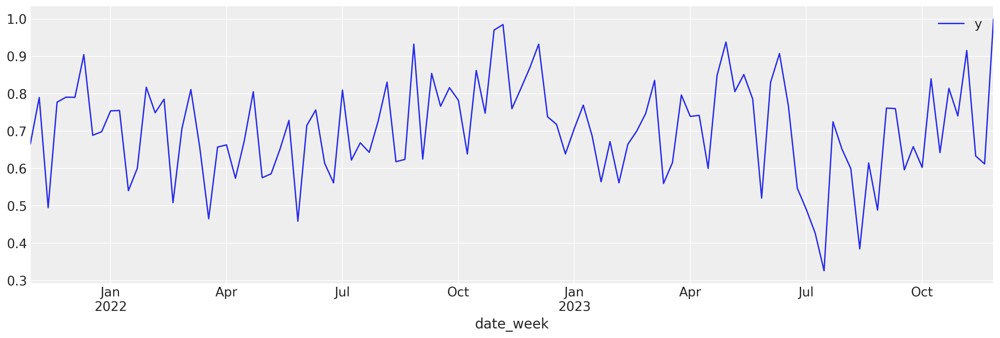

In [16]:
Y_scaled[Y_scaled['group'] == 1].plot(x='date_week', y='y', figsize=(15, 5))

## Modelo

Tenemos una tabla con $N = \sum_{g=1}^{G}{T_g}$ observaciones, donde:

* $G$ es el número de grupos (12 en nuestro caso).
* $T_g$ es el número de observaciones del grupo $g = 1,...,G$.

En nuestro modelo:

* Cada observacion lleva asociada la marca de tiempo en que se produjo, $t[i]$, y el grupo al que pertenece, $g[i]$, de manera que $t[i] \in \{1,...,T_{g[i]}\}$ para $i = 1,...,N$.
* En cada observación la variable objetivo es $y_i = y_{g[i], t[i]}$, lo que indica que es la respuesta del grupo $g[i]$ en el instante $t[i]$.
* Abreviaremos la notación anterior a $y_{g,t}$.

Con esta notación, el modelo que queremos ajustar es:

$$
y_{g,t} = \mu_{g,t} + s_{g,t} + \sum_{i=1}^{M}{\beta_{g,i} x_{t,i}} + \sum_{j=1}^{C}{\gamma_{g,j} z_{t,j}} + \epsilon_{g,t}
$$

* Tenemos $M$ variables de *medios*, $X_i$, y $C$ variables de *control*, $Z_j$.
* Cada grupo $g$ tiene sus propios coeficientes para las variables de medios, $\beta_{g,i}$ y de control, $\gamma_{g,j}$.
* $\mu_{g,t}$ es la tendencia del grupo $g$ en el instante $t$. Se modela de la siguiente manera:

$$
\mu_{g,t} = \alpha_{g,0} + \alpha_{g,1} t^{k_g} 
$$

* $s_{g,t}$ es la estacionalidad del grupo $g$ en el instante $t$. Se modela de la siguiente manera:

$$
s_{g,t} = \sum_{m=1}^{M}{\Alpha_{g,m} \sin\left(\frac{2\pi m t}{T}\right) + \Beta_{g,m} \cos\left(\frac{2\pi m t}{T}\right)}
$$

donde $T$ es el periodo de la estacionalidad (en nuestro caso, 365.25 días) y $M$ es el orden de los senos y cosenos.

In [18]:
RANDOM_SEED = 11111
rng = np.random.default_rng(RANDOM_SEED)

### Definición del modelo

In [17]:
n_order = 2

groups_idx, groups = X_scaled["group"].factorize(sort=True)
media_vars         = ['x1_adstock_saturated', 'x2_adstock_saturated']
control_vars       = ['event_1', 'event_2']

coords = {
    'group':            groups,
    'media_vars':       media_vars,
    'control_vars':     control_vars,
    'vars':             media_vars + control_vars,
    "fourier_features": np.arange(2 * n_order),
    'obs':              X_scaled.index.to_numpy()
}

In [19]:
with pm.Model(coords = coords) as model_1:
    
    ### DATA
    X_t       = pm.MutableData('X_t',       X_scaled['t'],          dims=('obs'))
    X_fourier = pm.MutableData('X_fourier', fourier_features,       dims=('obs', 'fourier_features'))
    X_media   = pm.MutableData('X_media',   X_scaled[media_vars],   dims=('obs', 'media_vars'))
    X_control = pm.MutableData('X_control', X_scaled[control_vars], dims=('obs', 'control_vars'))
    Y         = pm.MutableData('Y',         Y_scaled['y'].values,   dims='obs')

    ## HYPERPRIORS
    
    # Intercept positiva
    alpha_trend       = pm.HalfNormal("alpha", sigma=1)
    sigma_alpha_trend = pm.Exponential("sigma_alpha_trend", lam=1)
    beta_trend        = pm.Normal('beta_trend', mu = 0, sigma = 1)
    sigma_beta_trend  = pm.Exponential("sigma_beta_trend", lam=1)
    k                 = pm.Uniform("k", lower=0.1, upper=4)
    # Media vars positivas
    mu_media_var      = pm.Exponential('mu_media_var',    lam = 1)
    sigma_media_var   = pm.Exponential('sigma_media_var', lam = 1)
    # Control vars libres
    mu_control_var    = pm.Normal('mu_control_var', mu = 0, sigma = 1)
    sigma_control_var = pm.Exponential('sigma_control_var', lam = 1)
    
    # Noise
    sigma_noise       = pm.Exponential('noise', lam = 1, dims='group')
    
    ## COMPONENTES
    
    # Trend
    alphas_trend     = pm. Normal('alphas_trend', mu = alpha_trend, sigma = sigma_alpha_trend, dims='group')
    betas_trend      = pm. Normal('betas_trend',  mu = beta_trend,  sigma = sigma_beta_trend,  dims='group')    
    ks               = pm. Normal('ks',           mu = k,           sigma = 0.5,               dims='group')    
    
    trend = pm.Deterministic("trend", alphas_trend[groups_idx] + betas_trend[groups_idx] * X_t**ks[groups_idx], dims="obs")
    
    # Seasonality
    betas_fourier = pm.Normal("beta_fourier", mu=0, sigma=1, dims = ("group", "fourier_features"))
    
    seasonality = pm.Deterministic(
        "seasonality", 
        # pm.math.dot(X_fourier[groups_idx], betas_fourier[groups_idx]),
        (betas_fourier[groups_idx,:] * X_fourier).sum(axis=-1),
        dims = "obs"
    )
        
    # Coeficientes
    betas  = pm.Normal(f'beta',  mu = mu_media_var, sigma=sigma_media_var,     dims = ('group', 'media_vars'))
    gammas = pm.Normal(f'gamma', mu = mu_control_var, sigma=sigma_control_var, dims = ('group', 'control_vars'))
    
    # Contribuciones
    contribs_media_vars   = pm.Deterministic(f'contrib_media_vars',   betas[groups_idx] * X_media ,    dims=('obs', 'media_vars'))
    contribs_control_vars = pm.Deterministic(f'contrib_control_vars', gammas[groups_idx] * X_control , dims=('obs', 'control_vars'))
    
    # Media de ventas
    mu = pm.Deterministic(
        "mu", 
        contribs_media_vars.sum(axis=-1) + contribs_control_vars.sum(axis=-1) + trend + seasonality, 
        dims = 'obs'
        )
    
    ### LIKELIHOOD 
    y_obs = pm.Normal("y_obs", mu=mu, sigma=sigma_noise[groups_idx], observed=Y)

### Prior Predictive Check

In [20]:
with model_1:
    prior_pc_1 = pm.sample_prior_predictive()

Sampling: [alpha, alphas_trend, beta, beta_fourier, beta_trend, betas_trend, gamma, k, ks, mu_control_var, mu_media_var, noise, sigma_alpha_trend, sigma_beta_trend, sigma_control_var, sigma_media_var, y_obs]


In [21]:
prior_pc_1

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data
	> constant_data

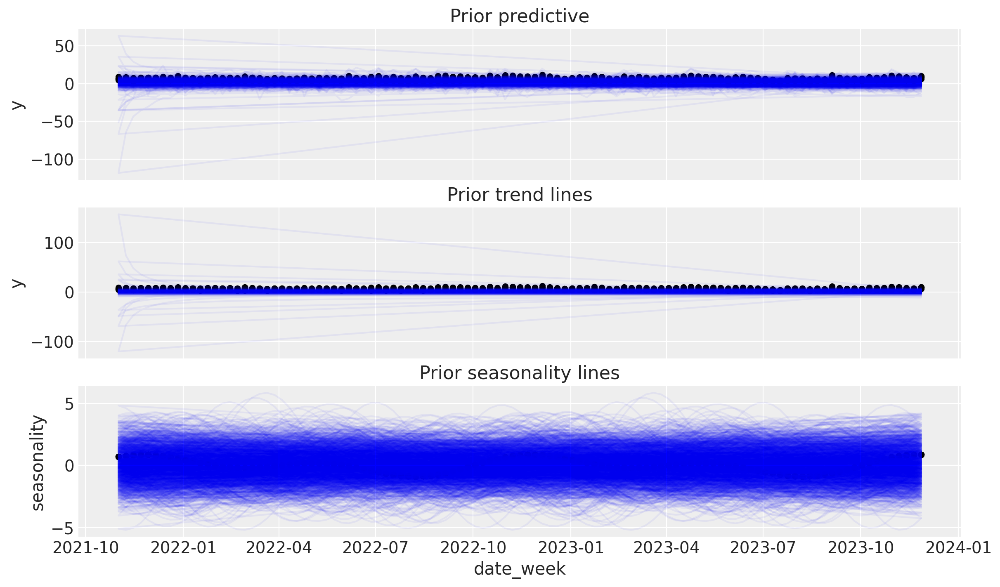

In [22]:
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True)

ax[0].plot(
    df["date_week"],
    az.extract(prior_pc_1, group="prior_predictive", num_samples=100)["y_obs"],
    color="blue",
    alpha=0.05,
)
df.plot.scatter(x="date_week", y="y", color="k", ax=ax[0])
ax[0].set_title("Prior predictive")

ax[1].plot(
    df["date_week"],
    az.extract(prior_pc_1, group="prior", num_samples=100)["trend"] ,
    color="blue",
    alpha=0.05,
)
df.plot.scatter(x="date_week", y="y", color="k", ax=ax[1])
ax[1].set_title("Prior trend lines");

ax[2].plot(
    df["date_week"],
    az.extract(prior_pc_1, group="prior", num_samples=100)["seasonality"] ,
    color="blue",
    alpha=0.05,
)
df.plot.scatter(x="date_week", y="seasonality", color="k", ax=ax[2])
ax[2].set_title("Prior seasonality lines");


### Posterior Sampling

In [23]:
with model_1:
    idata_1 = pm.sample(
        nuts_sampler         = 'numpyro',
        draws                =  1000,
        # chains               = 5,
        # target_accept        = 0.9,
        # random_seed          = rng,
        # return_inferencedata = True, 
        # idata_kwargs         = {"log_likelihood": True},
        )

Compiling...
Compilation time = 0:00:19.191541
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time = 0:05:03.705975
Transforming variables...
Transformation time = 0:00:03.855640


### Diagnostics

#### Trace plot

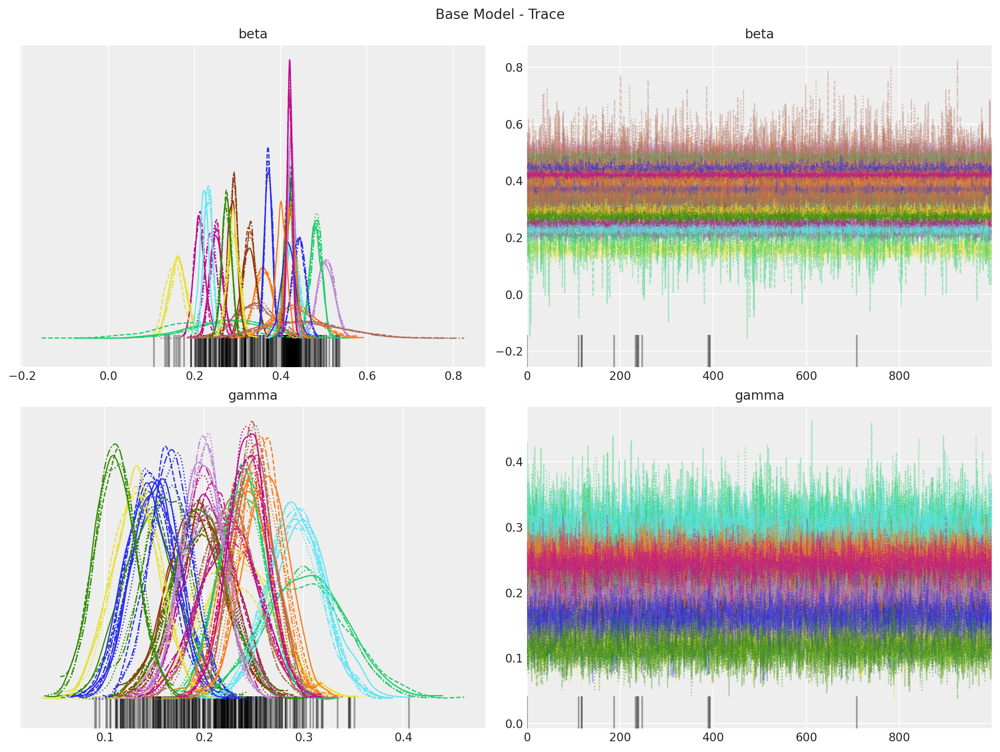

In [24]:
axes = az.plot_trace(
    data=idata_1,
    var_names=["beta", "gamma"],
    compact=True,
    backend_kwargs={
        "figsize": (12, 9),
        "layout": "constrained"
    },
)
fig = axes[0][0].get_figure()
fig.suptitle("Base Model - Trace");

In [25]:
idata_1

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data
	> constant_data

#### Summary

In [26]:
scaled_summary = az.summary(idata_1, var_names=['beta'], coords = {'media_vars': ['x1_adstock_saturated']}) 
scaled_summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"beta[1, x1_adstock_saturated]",0.425,0.010,0.406,0.444,0.000,0.000,5597.0,2764.0,1.00
"beta[2, x1_adstock_saturated]",0.420,0.010,0.401,0.437,0.001,0.001,140.0,1827.0,1.02
"beta[3, x1_adstock_saturated]",0.327,0.015,0.298,0.355,0.000,0.000,4314.0,2736.0,1.00
"beta[4, x1_adstock_saturated]",0.159,0.020,0.121,0.195,0.002,0.001,108.0,1994.0,1.03
"beta[5, x1_adstock_saturated]",0.505,0.019,0.470,0.543,0.000,0.000,3324.0,2826.0,1.00
"beta[6, x1_adstock_saturated]",0.371,0.009,0.355,0.387,0.000,0.000,6814.0,3148.0,1.00
"beta[7, x1_adstock_saturated]",0.424,0.012,0.402,0.446,0.000,0.000,5400.0,2834.0,1.00
"beta[8, x1_adstock_saturated]",0.290,0.010,0.272,0.311,0.001,0.000,343.0,2869.0,1.02
"beta[9, x1_adstock_saturated]",0.290,0.015,0.263,0.318,0.000,0.000,3936.0,2982.0,1.00
"beta[10, x1_adstock_saturated]",0.424,0.008,0.410,0.439,0.000,0.000,5586.0,2907.0,1.00


#### Estimates vs Ground Truth Pars

In [27]:
pars['beta1']

0     4.237121
1     4.512956
2     2.667074
3     1.283487
4     4.865899
5     3.592233
6     4.205355
7     2.315399
8     3.041635
9     4.094765
10    4.472368
11    3.308621
Name: beta1, dtype: float64

In [28]:
scaled_summary[['mean', 'sd', 'hdi_3%', 'hdi_97%', 'mcse_mean', 'mcse_sd']].multiply(the_Y_scaler.scaling_factors_['y'].values, axis = 0)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd
"beta[1, x1_adstock_saturated]",4.336672,0.102039,4.142797,4.530547,0.000000,0.000000
"beta[2, x1_adstock_saturated]",4.488481,0.106869,4.285431,4.670157,0.010687,0.010687
"beta[3, x1_adstock_saturated]",2.935979,0.134678,2.675602,3.187378,0.000000,0.000000
"beta[4, x1_adstock_saturated]",1.024996,0.128930,0.780028,1.257070,0.012893,0.006447
"beta[5, x1_adstock_saturated]",4.771992,0.179540,4.441259,5.131072,0.000000,0.000000
"beta[6, x1_adstock_saturated]",3.669033,0.089006,3.510800,3.827267,0.000000,0.000000
"beta[7, x1_adstock_saturated]",4.116668,0.116509,3.903067,4.330268,0.000000,0.000000
"beta[8, x1_adstock_saturated]",2.252051,0.077657,2.112268,2.415130,0.007766,0.000000
"beta[9, x1_adstock_saturated]",2.815320,0.145620,2.553204,3.087144,0.000000,0.000000
"beta[10, x1_adstock_saturated]",4.099548,0.077350,3.964185,4.244579,0.000000,0.000000


In [29]:
az.summary(idata_1, var_names=['ks'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ks[1],0.720,0.290,0.246,1.306,0.008,0.006,1145.0,831.0,1.00
ks[2],0.284,0.479,-0.296,1.064,0.222,0.168,6.0,177.0,1.76
ks[3],0.533,0.187,0.201,0.891,0.022,0.015,58.0,515.0,1.05
ks[4],0.529,0.517,-0.376,1.257,0.233,0.175,7.0,34.0,1.63
ks[5],0.492,0.171,0.168,0.794,0.034,0.024,23.0,156.0,1.12
ks[6],0.616,0.191,0.285,0.991,0.005,0.004,1313.0,1238.0,1.01
ks[7],0.626,0.202,0.245,0.999,0.021,0.015,83.0,858.0,1.04
ks[8],0.446,0.385,-0.258,0.908,0.181,0.137,6.0,31.0,1.67
ks[9],0.687,0.186,0.349,1.033,0.005,0.003,1563.0,1495.0,1.01
ks[10],0.656,0.151,0.387,0.947,0.004,0.003,1371.0,1268.0,1.02


### Posterior Predictive Check (Prediction)

In [30]:
with model_1:
    ppc_1 = pm.sample_posterior_predictive(trace=idata_1)

Sampling: [y_obs]


In [31]:
ppc_1

Inference data with groups:
	> posterior_predictive
	> observed_data
	> constant_data

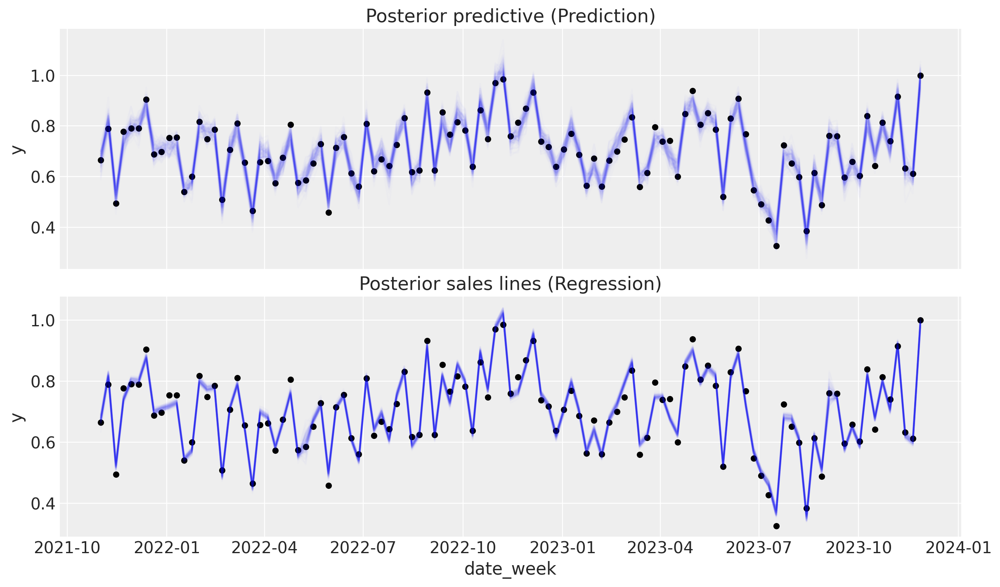

In [32]:
G = 1

mask = (Y_scaled['group'] == G)

fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True)

ax[0].plot(
    Y_scaled[mask]["date_week"],
    az.extract(ppc_1, group="posterior_predictive", num_samples=100)["y_obs"][mask,:],
    color="blue",
    alpha=0.01,
)
Y_scaled[mask].plot.scatter(x="date_week", y="y", color="k", ax=ax[0])
ax[0].set_title("Posterior predictive (Prediction)")

ax[1].plot(
    Y_scaled[mask]["date_week"],
    az.extract(idata_1, group="posterior", num_samples=100)["mu"][mask,:],
    color="blue",
    alpha=0.01,
)
Y_scaled[mask].plot.scatter(x="date_week", y="y", color="k", ax=ax[1])
ax[1].set_title("Posterior sales lines (Regression)");

#### Contributions

In [33]:
season          = az.summary(idata_1, var_names=['seasonality'])
trend           = az.summary(idata_1, var_names=['trend'])
contrib_media   = az.extract(idata_1, group="posterior", var_names=['contrib_media_vars']).sum(["media_vars"]).mean("sample")
contrib_control = az.extract(idata_1, group="posterior", var_names=['contrib_control_vars']).sum(["control_vars"]).mean("sample")

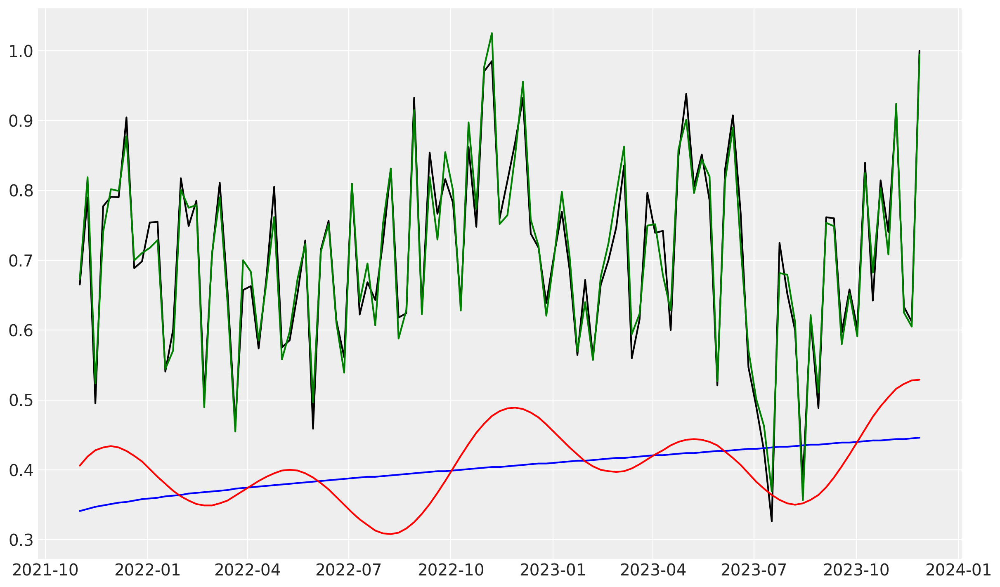

In [34]:
mask = (groups_idx == 0)

import matplotlib.pyplot as plt

plt.plot(X_scaled[mask]["date_week"], Y_scaled[mask]['y'], color="k")
plt.plot(X_scaled[mask]["date_week"], trend[mask].reset_index()['mean'], color="blue")
plt.plot(X_scaled[mask]["date_week"], trend[mask].reset_index()['mean'].values + season[mask].reset_index()['mean'].values, color="red")
plt.plot(
    X_scaled[mask]["date_week"], 
    trend[mask].reset_index()['mean'].values + \
        season[mask].reset_index()['mean'].values + \
        contrib_media[mask] + contrib_control[mask], 
    color="green"
    )



### Métricas

In [123]:
from utils.tools import compute_metrics

rmse, mse, mae, mape, r2 = compute_metrics(idata_1, Y_scaled)

In [124]:
rmse.mean('sample')

<xarray.DataArray (group: 12)>
array([0.02561238, 0.02550716, 0.02827746, 0.04690676, 0.02863017,
       0.02279262, 0.03246511, 0.02921146, 0.0245989 , 0.02095954,
       0.02194514, 0.02036715])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

In [125]:
mse.mean('sample')

<xarray.DataArray (group: 12)>
array([0.00065632, 0.00065195, 0.00080002, 0.00220284, 0.00082011,
       0.00051976, 0.00105445, 0.00085482, 0.00060542, 0.00043953,
       0.00048258, 0.00041506])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

In [126]:
mae.mean('sample')

<xarray.DataArray (group: 12)>
array([0.02104021, 0.02004848, 0.02287347, 0.03781818, 0.02379357,
       0.01841894, 0.02604666, 0.02340291, 0.01937526, 0.01686587,
       0.01772499, 0.01662638])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

In [127]:
mape.mean('sample')

<xarray.DataArray (group: 12)>
array([0.03118631, 0.03081154, 0.03064879, 0.0530637 , 0.0318956 ,
       0.02721808, 0.03957987, 0.03605927, 0.02778757, 0.02482569,
       0.02414644, 0.02971328])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

In [128]:
r2.mean('sample')

<xarray.DataArray (group: 12)>
array([0.99872293, 0.99858744, 0.99864884, 0.99599674, 0.99862909,
       0.99897365, 0.99783235, 0.99812449, 0.99887176, 0.99915854,
       0.99915607, 0.99888412])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

c:\Users\mcondedesimon\Documents\PROYECTOS\nh_mmm_23\.venv\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\Users\mcondedesimon\Documents\PROYECTOS\nh_mmm_23\.venv\Lib\site-packages\seaborn\_core.py:1218: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


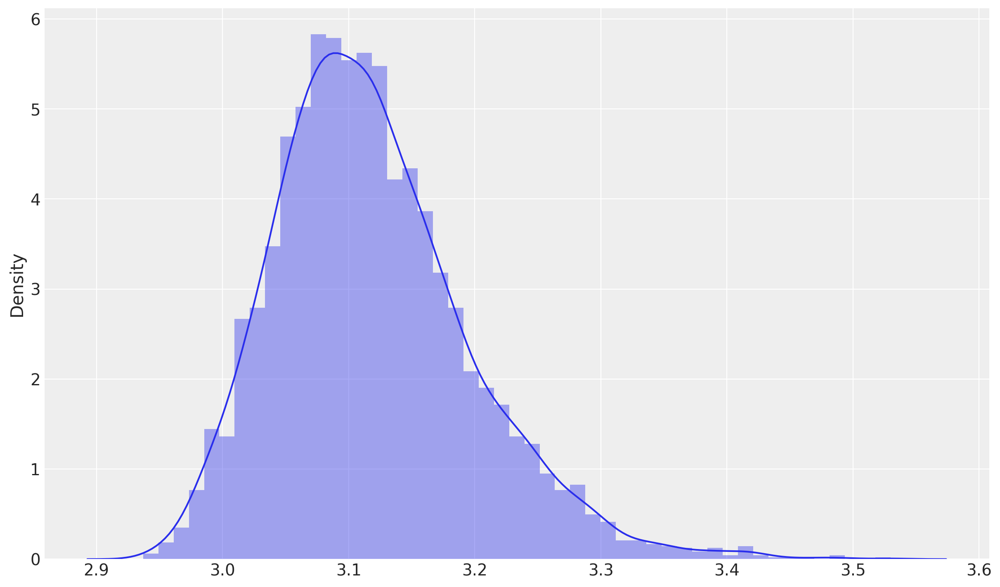

In [129]:
import seaborn as sns

sns.distplot(100*mape.loc[:,'group_1'].values, hist=True, kde=True,);

# MODELADO CON ADSTOCK Y SATURACIÓN

## Preparación de los datos

### Features y datasets

In [251]:
# Nos quedamos con las variables explicativas de interés 
X = df[['date_week', 'x1', 'x2', 'event_1', 'event_2',
        # 'feeder_market', 'segmento_cliente', 'canal', 'segmento_hotel', 
        'group']].copy()

# Creamos por grupo una columna para la tendencia
for g in df['group'].unique():
    X.loc[X['group'] == g, 't'] = np.linspace(1, sum(df['group'] == g), num = sum(df['group'] == g)) 

# Creamos tembién por grupo las variables de Fourier para la estacionalidad  
fourier_features = pd.DataFrame()
for g in df['group'].unique():
    fourier_features_g = make_fourier_features(df[df['group'] == g], "date_week", n_order=2, period=365.25)
    fourier_features = pd.concat([fourier_features, fourier_features_g], axis=0)
X = pd.concat([X, fourier_features], axis=1)

# Nos quedamos con la variable respuesta                 
Y = df[["date_week", "y", "group"]].copy()

In [36]:
X

,date_week,x1,x2,event_1,event_2,group,t,sin_order_1,cos_order_1,sin_order_2,cos_order_2
0,2021-11-01,0.195552,0.870475,0.0,0.0,1,1.0,-0.871351,0.490660,-0.855075,-0.518505
1,2021-11-08,0.421106,0.000000,0.0,0.0,1,2.0,-0.806100,0.591779,-0.954067,-0.299595
2,2021-11-15,0.038913,0.000000,0.0,0.0,1,3.0,-0.729175,0.684328,-0.997989,-0.063391
3,2021-11-22,0.274762,0.000000,0.0,0.0,1,4.0,-0.641689,0.766965,-0.984306,0.176471
4,2021-11-29,0.388552,0.000000,0.0,0.0,1,5.0,-0.544910,0.838495,-0.913808,0.406147
...,...,...,...,...,...,...,...,...,...,...,...
1303,2023-10-30,0.098766,0.960184,0.0,0.0,12,105.0,-0.891640,0.452745,-0.807371,-0.590044
1304,2023-11-06,0.426763,0.000000,0.0,0.0,12,106.0,-0.830797,0.556576,-0.924803,-0.380447
1305,2023-11-13,0.039869,0.000000,0.0,0.0,12,107.0,-0.757922,0.652346,-0.988854,-0.148890
1306,2023-11-20,0.023204,0.000000,0.0,0.0,12,108.0,-0.674069,0.738668,-0.995827,0.091261


### Escalado

In [37]:
# Escalado de las variables predictivas
the_X_scaler = CustomGroupScaler(columns=['t'], group_columns=['group'], method='max')
X_scaled = the_X_scaler.fit_transform(X)

# Escalado de la variable respuesta
the_Y_scaler = CustomGroupScaler(columns=['y'], group_columns=['group'], method='max')
Y_scaled = the_Y_scaler.fit_transform(Y)

## Modelo

### Definición del modelo

In [40]:
RANDOM_SEED = 11111
rng = np.random.default_rng(RANDOM_SEED)

In [39]:
n_order = 2

L_MAX = 8

groups_idx, groups = X_scaled["group"].factorize(sort=True)
media_vars         = ['x1', 'x2']
control_vars       = ['event_1', 'event_2']

coords = {
    'group':            groups,
    'media_vars':       media_vars,
    'control_vars':     control_vars,
    'vars':             media_vars + control_vars,
    "fourier_features": np.arange(2 * n_order),
    'obs':              X_scaled.index.to_numpy()
}

In [41]:
from pymc_marketing.mmm.transformers import geometric_adstock, logistic_saturation, tanh_saturation
import pytensor.tensor as pt

with pm.Model(coords = coords) as model_2:
    
    ### DATA
    X_t       = pm.MutableData('X_t',       X_scaled['t'],          dims=('obs'))
    X_fourier = pm.MutableData('X_fourier', fourier_features,       dims=('obs', 'fourier_features'))
    X_media   = pm.MutableData('X_media',   X_scaled[media_vars],   dims=('obs', 'media_vars'))
    X_control = pm.MutableData('X_control', X_scaled[control_vars], dims=('obs', 'control_vars'))
    Y         = pm.MutableData('Y',         Y_scaled['y'].values,   dims='obs')

    ## HYPERPRIORS
    
    # Intercept positiva
    alpha_trend       = pm.HalfNormal("alpha", sigma=1)
    sigma_alpha_trend = pm.Exponential("sigma_alpha_trend", lam=1)
    beta_trend        = pm.Normal('beta_trend', mu = 0, sigma = 1)
    sigma_beta_trend  = pm.Exponential("sigma_beta_trend", lam=1)
    k                 = pm.Uniform("k", lower=0.1, upper=4)
    # Media vars positivas
    mu_media_var      = pm.Exponential('mu_media_var',    lam = 1)
    sigma_media_var   = pm.Exponential('sigma_media_var', lam = 1)
    # Adstock - para la distribucion beta del recuerdo
    alpha_as_media_var = pm.Uniform(f'alpha_as_media_var', lower=1, upper=4)
    beta_as_media_var  = pm.Uniform(f'beta_as_media_var', lower=1, upper=4)
    # Saturations - para la distribución exponencial de la saturación
    lam_media_var      = pm.Exponential(f'lam_media_var', lam = 1)
    # Control vars libres
    mu_control_var    = pm.Normal('mu_control_var', mu = 0, sigma = 1)
    sigma_control_var = pm.Exponential('sigma_control_var', lam = 1)
    
    # Noise
    sigma_noise       = pm.Exponential('noise', lam = 1, dims='group')
    
    ## COMPONENTES
    
    # Trend
    alphas_trend     = pm. Normal('alphas_trend', mu = alpha_trend, sigma = sigma_alpha_trend, dims='group')
    betas_trend      = pm. Normal('betas_trend',  mu = beta_trend,  sigma = sigma_beta_trend,  dims='group')    
    ks               = pm. Normal('ks',           mu = k,           sigma = 0.5,               dims='group')    
    
    trend = pm.Deterministic("trend", alphas_trend[groups_idx] + betas_trend[groups_idx] * X_t**ks[groups_idx], dims="obs")
    
    # Seasonality
    betas_fourier = pm.Normal("beta_fourier", mu=0, sigma=1, dims = ("group", "fourier_features"))
    
    seasonality = pm.Deterministic(
        "seasonality", 
        # pm.math.dot(X_fourier[groups_idx], betas_fourier[groups_idx]),
        (betas_fourier[groups_idx,:] * X_fourier).sum(axis=-1),
        dims = "obs"
    )
        
    # Coeficientes
    betas  = pm.Normal(f'beta',  mu = mu_media_var, sigma=sigma_media_var,     dims = ('group', 'media_vars'))
    gammas = pm.Normal(f'gamma', mu = mu_control_var, sigma=sigma_control_var, dims = ('group', 'control_vars'))
    
    # Pars Adstock
    alphas_as = pm.Beta(f'alpha_as_media_vars', alpha = alpha_as_media_var, beta = beta_as_media_var, dims = ('group', 'media_vars'))
    
    # Pars Saturation
    lams = pm.Exponential(f'lam_media_vars', lam = lam_media_var, dims = ('group', 'media_vars'))
    
    # Adstock 
    geom_as_media_var_list = []

    # Itera sobre cada grupo y aplica adstock, luego agrega el resultado a la lista
    for g in groups:
        adstocked = geometric_adstock(x=X_media[g == (groups_idx + 1)], alpha=alphas_as[g-1], l_max=L_MAX, normalize=True, axis=0)
        geom_as_media_var_list.append(adstocked)

    # Concatena los resultados para formar el tensor geom_as_media_var
    geom_as_media_var = pm.Deterministic(
        'geom_as_media_var',
        pt.concatenate(geom_as_media_var_list, axis=0), 
        dims=('obs', 'media_vars')
        )
    
    # Saturacion
    satur_geom_as_media_var = pm.Deterministic(
        'satur_geom_as_media_var', 
        logistic_saturation(x=geom_as_media_var, lam=lams[groups_idx]), 
        dims=('obs', 'media_vars')
        )
    
    # Contribuciones
    contribs_media_vars   = pm.Deterministic(f'contrib_media_vars',   betas[groups_idx] * satur_geom_as_media_var , dims=('obs', 'media_vars'))
    contribs_control_vars = pm.Deterministic(f'contrib_control_vars', gammas[groups_idx] * X_control ,              dims=('obs', 'control_vars'))
    
    # Media de ventas
    mu = pm.Deterministic(
        "mu", 
        contribs_media_vars.sum(axis=-1) + contribs_control_vars.sum(axis=-1) + trend + seasonality, 
        dims = 'obs'
        )
    
    ### LIKELIHOOD 
    y_obs = pm.Normal("y_obs", mu=mu, sigma=sigma_noise[groups_idx], observed=Y)

### Prior Predictive Check

In [42]:
with model_2:
    prior_pc_2 = pm.sample_prior_predictive()

Sampling: [alpha, alpha_as_media_var, alpha_as_media_vars, alphas_trend, beta, beta_as_media_var, beta_fourier, beta_trend, betas_trend, gamma, k, ks, lam_media_var, lam_media_vars, mu_control_var, mu_media_var, noise, sigma_alpha_trend, sigma_beta_trend, sigma_control_var, sigma_media_var, y_obs]


In [116]:
prior_pc_2

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data
	> constant_data

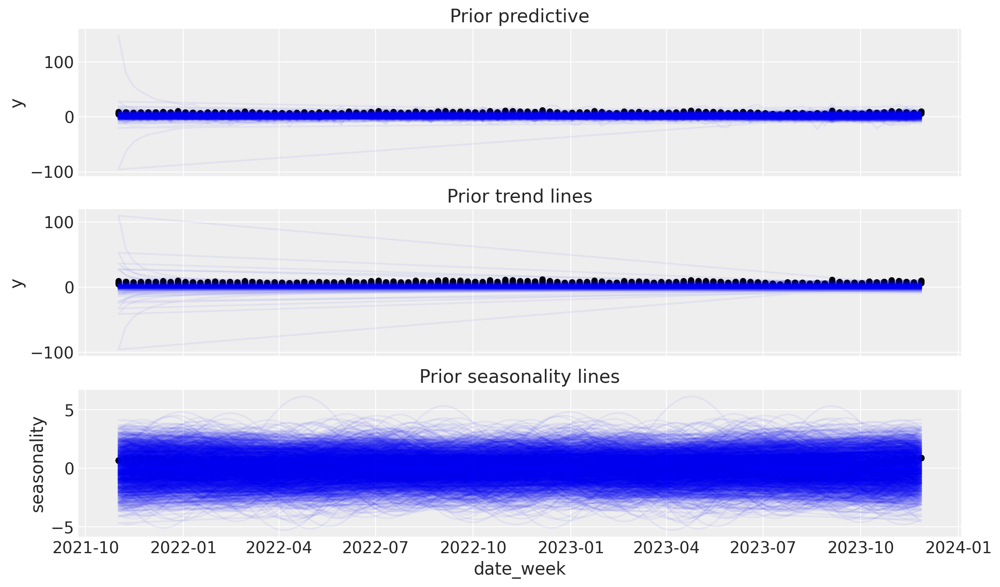

In [117]:
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True)

ax[0].plot(
    df["date_week"],
    az.extract(prior_pc_2, group="prior_predictive", num_samples=100)["y_obs"],
    color="blue",
    alpha=0.05,
)
df.plot.scatter(x="date_week", y="y", color="k", ax=ax[0])
ax[0].set_title("Prior predictive")

ax[1].plot(
    df["date_week"],
    az.extract(prior_pc_2, group="prior", num_samples=100)["trend"] ,
    color="blue",
    alpha=0.05,
)
df.plot.scatter(x="date_week", y="y", color="k", ax=ax[1])
ax[1].set_title("Prior trend lines");

ax[2].plot(
    df["date_week"],
    az.extract(prior_pc_2, group="prior", num_samples=100)["seasonality"] ,
    color="blue",
    alpha=0.05,
)
df.plot.scatter(x="date_week", y="seasonality", color="k", ax=ax[2])
ax[2].set_title("Prior seasonality lines");


### Posterior Sampling

In [43]:
with model_2:
    idata_2 = pm.sample(
        nuts_sampler         = 'numpyro',
        draws                =  1000,
        # chains               = 5,
        # target_accept        = 0.9,
        # random_seed          = rng,
        # return_inferencedata = True, 
        # idata_kwargs         = {"log_likelihood": True},
        )

Compiling...
Compilation time = 0:02:40.802932
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time = 0:06:26.883393
Transforming variables...
Transformation time = 0:00:12.421332


### Diagnostics

#### Trace plot

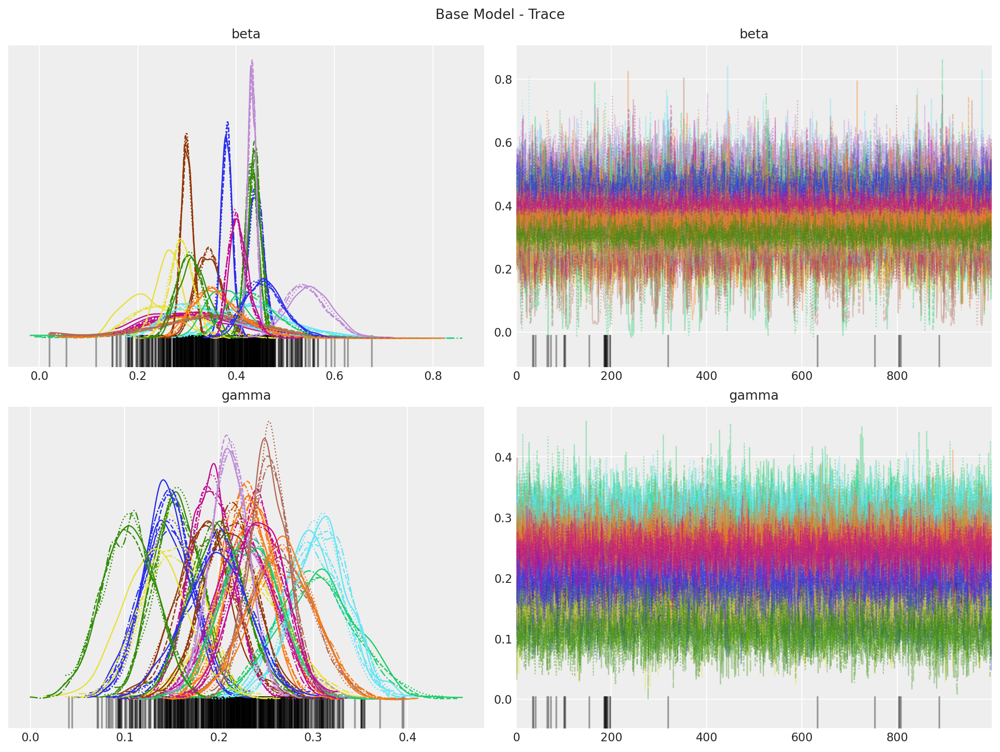

In [118]:
axes = az.plot_trace(
    data=idata_2,
    var_names=["beta", "gamma"],
    compact=True,
    backend_kwargs={
        "figsize": (12, 9),
        "layout": "constrained"
    },
)
fig = axes[0][0].get_figure()
fig.suptitle("Base Model - Trace");

#### Summary

In [120]:
scaled_summary = az.summary(idata_2, var_names=['beta'], coords = {'media_vars': ['x1']}) 
scaled_summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"beta[1, x1]",0.441,0.015,0.413,0.470,0.000,0.000,3836.0,2178.0,1.00
"beta[2, x1]",0.438,0.012,0.417,0.462,0.000,0.000,3516.0,2908.0,1.00
"beta[3, x1]",0.345,0.026,0.296,0.394,0.001,0.000,2669.0,2793.0,1.00
"beta[4, x1]",0.254,0.066,0.141,0.374,0.008,0.006,68.0,2183.0,1.05
"beta[5, x1]",0.546,0.044,0.465,0.627,0.001,0.001,2039.0,2296.0,1.01
"beta[6, x1]",0.381,0.011,0.361,0.403,0.000,0.000,4763.0,2870.0,1.00
"beta[7, x1]",0.432,0.013,0.407,0.456,0.000,0.000,4515.0,2815.0,1.00
"beta[8, x1]",0.300,0.012,0.277,0.322,0.000,0.000,3931.0,3004.0,1.00
"beta[9, x1]",0.283,0.027,0.232,0.333,0.005,0.004,25.0,60.0,1.10
"beta[10, x1]",0.433,0.009,0.417,0.448,0.000,0.000,4247.0,2919.0,1.00


#### Estimates vs Ground Truth Pars

In [121]:
pars['beta1']

0     4.237121
1     4.512956
2     2.667074
3     1.283487
4     4.865899
5     3.592233
6     4.205355
7     2.315399
8     3.041635
9     4.094765
10    4.472368
11    3.308621
Name: beta1, dtype: float64

In [122]:
scaled_summary[['mean', 'sd', 'hdi_3%', 'hdi_97%', 'mcse_mean', 'mcse_sd']].multiply(the_Y_scaler.scaling_factors_['y'].values, axis = 0)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd
"beta[1, x1]",4.499935,0.153059,4.214225,4.795849,0.000000,0.000000
"beta[2, x1]",4.680844,0.128242,4.456420,4.937329,0.000000,0.000000
"beta[3, x1]",3.097593,0.233442,2.657645,3.537541,0.008979,0.000000
"beta[4, x1]",1.637415,0.425470,0.908959,2.410997,0.051572,0.038679
"beta[5, x1]",5.159421,0.415777,4.394012,5.924829,0.009449,0.009449
"beta[6, x1]",3.767929,0.108785,3.570138,3.985500,0.000000,0.000000
"beta[7, x1]",4.194341,0.126219,3.951613,4.427360,0.000000,0.000000
"beta[8, x1]",2.329707,0.093188,2.151097,2.500553,0.000000,0.000000
"beta[9, x1]",2.747364,0.262116,2.252256,3.232764,0.048540,0.038832
"beta[10, x1]",4.186566,0.087019,4.031866,4.331597,0.000000,0.000000


### Posterior Predictive Check (Prediction)

In [44]:
with model_2:
    ppc_2 = pm.sample_posterior_predictive(trace=idata_2)

Sampling: [y_obs]


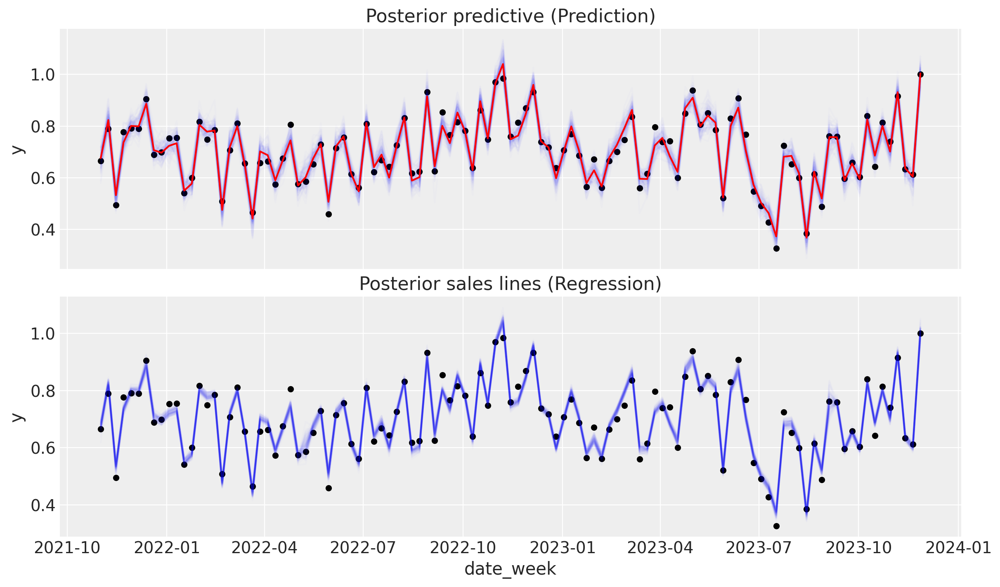

In [45]:
G = 1

mask = (Y_scaled['group'] == G)

fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True)

ax[0].plot(
    Y_scaled[mask]["date_week"],
    az.extract(ppc_2, group="posterior_predictive", num_samples=100)["y_obs"][mask,:],
    color="blue",
    alpha=0.01,
)
ax[0].plot(
    Y_scaled[mask]["date_week"],
    az.extract(ppc_2, group="posterior_predictive")["y_obs"][mask,:].mean('sample'),
    color="red",
)
Y_scaled[mask].plot.scatter(x="date_week", y="y", color="k", ax=ax[0])
ax[0].set_title("Posterior predictive (Prediction)")

ax[1].plot(
    Y_scaled[mask]["date_week"],
    az.extract(idata_2, group="posterior", num_samples=100)["mu"][mask,:],
    color="blue",
    alpha=0.01,
)
Y_scaled[mask].plot.scatter(x="date_week", y="y", color="k", ax=ax[1])
ax[1].set_title("Posterior sales lines (Regression)");

#### Contributions

In [46]:
season          = az.summary(idata_2, var_names=['seasonality'])
trend           = az.summary(idata_2, var_names=['trend'])
contrib_media   = az.extract(idata_2, group="posterior", var_names=['contrib_media_vars']).sum(["media_vars"]).mean("sample")
contrib_control = az.extract(idata_2, group="posterior", var_names=['contrib_control_vars']).sum(["control_vars"]).mean("sample")

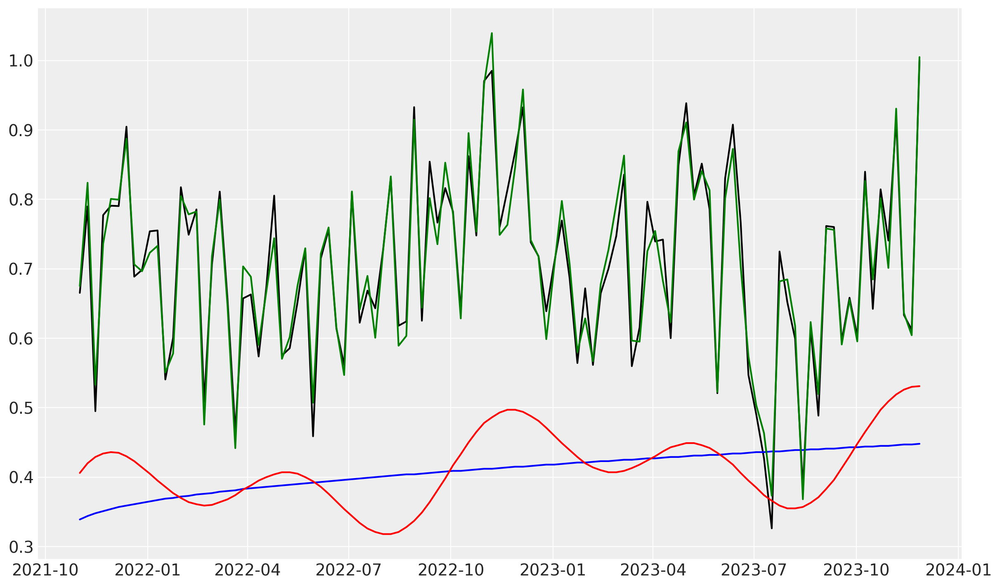

In [47]:
mask = (groups_idx == 0)

import matplotlib.pyplot as plt

plt.plot(X_scaled[mask]["date_week"], Y_scaled[mask]['y'], color="k")
plt.plot(X_scaled[mask]["date_week"], trend[mask].reset_index()['mean'], color="blue")
plt.plot(X_scaled[mask]["date_week"], trend[mask].reset_index()['mean'].values + season[mask].reset_index()['mean'].values, color="red")
plt.plot(
    X_scaled[mask]["date_week"], 
    trend[mask].reset_index()['mean'].values + \
        season[mask].reset_index()['mean'].values + \
        contrib_media[mask] + contrib_control[mask], 
    color="green"
    )

In [48]:
pars

,group,alpha1,alpha2,lmax1,lmax2,lam1,lam2,intercept,scale,beta1,beta2
0,1,0.637160,0.882989,1,9,5.236553,2.481417,2.768760,0.264807,4.237121,3.557457
1,2,0.224777,0.846223,1,13,6.831646,4.056204,2.075676,0.273335,4.512956,2.629494
2,3,0.584801,0.656784,2,11,9.626511,2.490410,2.537628,0.230060,2.667074,3.876381
3,4,0.142797,0.921940,2,8,9.983291,0.530525,2.215123,0.293112,1.283487,1.168898
4,5,0.773490,0.616031,3,6,9.016896,0.663217,1.888370,0.259840,4.865899,3.271697
5,6,0.094342,0.909485,1,15,6.737455,0.919315,2.968174,0.231870,3.592233,4.434173
6,7,0.848498,0.501397,1,8,9.776863,2.846526,1.712647,0.289857,4.205355,2.244600
7,8,0.667840,0.472947,1,12,8.558894,3.738453,1.611450,0.201837,2.315399,1.856546
8,9,0.506141,0.806276,3,6,5.009292,3.110337,2.731249,0.248123,3.041635,4.575664
9,10,0.938054,0.294355,1,11,9.378157,0.108201,2.522944,0.207931,4.094765,3.824097


In [49]:
az.summary(idata_2, var_names=['alpha_as_media_vars', 'lam_media_vars'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"alpha_as_media_vars[1, x1]",0.022,0.014,0.000,0.047,0.000,0.000,2861.0,2175.0,1.00
"alpha_as_media_vars[1, x2]",0.836,0.028,0.783,0.887,0.000,0.000,4425.0,2893.0,1.00
"alpha_as_media_vars[2, x1]",0.027,0.014,0.001,0.051,0.000,0.000,2238.0,1671.0,1.00
"alpha_as_media_vars[2, x2]",0.823,0.027,0.774,0.876,0.001,0.000,2810.0,2981.0,1.01
"alpha_as_media_vars[3, x1]",0.335,0.032,0.278,0.399,0.000,0.000,4592.0,2900.0,1.00
"alpha_as_media_vars[3, x2]",0.708,0.025,0.662,0.755,0.000,0.000,4413.0,2771.0,1.00
"alpha_as_media_vars[4, x1]",0.344,0.118,0.116,0.546,0.014,0.010,71.0,1484.0,1.04
"alpha_as_media_vars[4, x2]",0.629,0.240,0.171,0.984,0.004,0.003,4389.0,2647.0,1.00
"alpha_as_media_vars[5, x1]",0.542,0.023,0.498,0.585,0.000,0.000,4326.0,2760.0,1.00
"alpha_as_media_vars[5, x2]",0.824,0.100,0.657,0.998,0.002,0.001,2875.0,1896.0,1.00


In [50]:
az.summary(idata_2, var_names=['beta', 'gamma'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"beta[1, x1]",0.441,0.015,0.413,0.470,0.000,0.000,3836.0,2178.0,1.00
"beta[1, x2]",0.342,0.091,0.180,0.507,0.002,0.001,2528.0,2529.0,1.00
"beta[2, x1]",0.438,0.012,0.417,0.462,0.000,0.000,3516.0,2908.0,1.00
"beta[2, x2]",0.321,0.091,0.166,0.482,0.002,0.002,1561.0,2624.0,1.01
"beta[3, x1]",0.345,0.026,0.296,0.394,0.001,0.000,2669.0,2793.0,1.00
"beta[3, x2]",0.446,0.073,0.322,0.588,0.001,0.001,3400.0,2310.0,1.00
"beta[4, x1]",0.254,0.066,0.141,0.374,0.008,0.006,68.0,2183.0,1.05
"beta[4, x2]",0.338,0.116,0.113,0.565,0.003,0.002,2130.0,992.0,1.00
"beta[5, x1]",0.546,0.044,0.465,0.627,0.001,0.001,2039.0,2296.0,1.01
"beta[5, x2]",0.346,0.108,0.136,0.553,0.003,0.002,1888.0,1081.0,1.01


### Métricas

In [132]:
from utils.tools import compute_metrics

rmse, mse, mae, mape, wmape, r2 = compute_metrics(idata_2, Y_scaled)

In [114]:
rmse.mean('sample')

<xarray.DataArray (group: 12)>
array([0.02878072, 0.02479282, 0.03137324, 0.04702951, 0.03661027,
       0.02435356, 0.03273451, 0.02854124, 0.03266479, 0.02019619,
       0.03555273, 0.02704248])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

In [105]:
mse.mean('sample')

<xarray.DataArray (group: 12)>
array([0.00082893, 0.0006151 , 0.00098498, 0.00221374, 0.00134139,
       0.00059353, 0.00107226, 0.00081522, 0.00106987, 0.00040815,
       0.00126493, 0.00073184])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

In [106]:
mae.mean('sample')

<xarray.DataArray (group: 12)>
array([0.02304518, 0.02018763, 0.02528712, 0.03834793, 0.02897557,
       0.02009247, 0.02665577, 0.02267116, 0.02631691, 0.01626263,
       0.02955919, 0.02120429])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

In [55]:
mape.mean('sample')

<xarray.DataArray (group: 12)>
array([0.03421363, 0.03140529, 0.03423651, 0.05380596, 0.03932859,
       0.02983258, 0.04098623, 0.03498571, 0.03722699, 0.02387794,
       0.04146451, 0.03900271])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

In [133]:
wmape.mean('sample')

<xarray.DataArray (group: 12)>
array([0.02311166, 0.02031329, 0.02520496, 0.03805488, 0.02871587,
       0.01995498, 0.02678037, 0.02308634, 0.02642178, 0.01623473,
       0.02916533, 0.02088307])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

In [56]:
r2.mean('sample')

<xarray.DataArray (group: 12)>
array([0.99838707, 0.99866727, 0.99833644, 0.99597693, 0.9977577 ,
       0.99882796, 0.99779574, 0.99821137, 0.99800624, 0.99921862,
       0.9977879 , 0.99803246])
Coordinates:
  * group    (group) <U8 'group_1' 'group_2' 'group_3' ... 'group_11' 'group_12'

c:\Users\mcondedesimon\Documents\PROYECTOS\nh_mmm_23\.venv\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\Users\mcondedesimon\Documents\PROYECTOS\nh_mmm_23\.venv\Lib\site-packages\seaborn\_core.py:1218: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


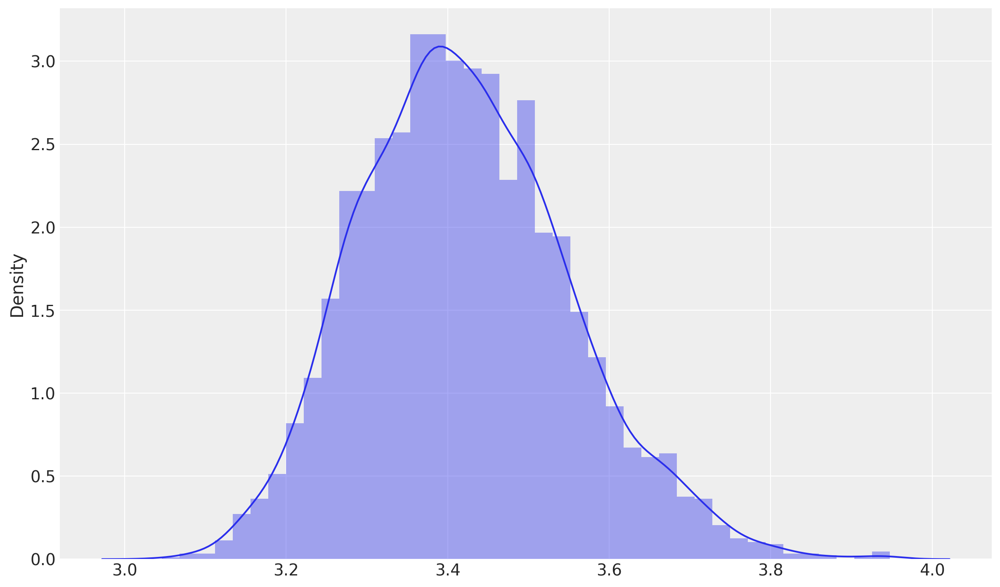

In [69]:
import seaborn as sns

sns.distplot(100*mape.loc[:,'group_1'].values, hist=True, kde=True,);

## Versión de Producción

In [324]:
from utils.models.model2 import Model2

In [325]:
model_config = Model2.get_default_model_config() | {
            "media_vars": media_vars,
            "control_vars": control_vars,
        }

the_model_2 = Model2(model_config)

In [326]:
idata = the_model_2.fit(X, Y['y'].to_numpy())

Compiling...
Compilation time = 0:03:05.657496
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time = 0:02:23.856058
Transforming variables...
Transformation time = 0:00:10.205061
Sampling: [alpha, alpha_as_media_var, alpha_as_media_vars, alphas_trend, beta, beta_as_media_var, beta_fourier, beta_trend, betas_trend, gamma, k, ks, lam_media_var, lam_media_vars, mu_control_var, mu_media_var, noise, sigma_alpha_trend, sigma_beta_trend, sigma_control_var, sigma_media_var, y_obs]
Sampling: [y_obs]


In [328]:
import os
the_model_2.save(os.path.join(gs.the_folders.DIR_OUTPUTS_MODELS, "model2.nc"))

# Gráfico de ajuste

In [210]:
G = 1

mask = (Y_scaled['group'] == G)

samples_pp = az.extract(ppc_2, group="posterior_predictive", num_samples=100)["y_obs"][mask,:]
avg_pp     = az.extract(ppc_2, group="posterior_predictive")["y_obs"][mask,:].mean('sample')
hdi_pp     = az.hdi(ppc_2, group="posterior_predictive", hdi_prob=0.95)["y_obs"][mask,:]

samples_p = az.extract(idata_2, group="posterior", num_samples=100)["mu"][mask,:]
avg_p     = az.extract(idata_2, group="posterior")["mu"][mask,:].mean('sample')
hdi_p     = az.hdi(idata_2, group="posterior", hdi_prob=0.95)["mu"][mask,:]

R2_avg = r2[{'group': G}].mean('sample')
R2_hdi = az.hdi(r2[{'group': G}], hdi_prob=0.95, input_core_dims=[["sample"]])
s_R2 = f"R2: {100*R2_avg.values:.2f}% ({100*R2_hdi['x'].sel(hdi = 'lower').values:.2f}%, {100*R2_hdi['x'].sel(hdi = 'higher').values:.2f}%)\n"

wMAPE_avg = wmape[{'group': G}].mean('sample')
wMAPE_hdi = az.hdi(wmape[{'group': G}], hdi_prob=0.95, input_core_dims=[["sample"]])
s_wMAPE = f"wMAPE: {100*wMAPE_avg.values:.2f}% ({100*wMAPE_hdi['x'].sel(hdi = 'lower').values:.2f}%, {100*wMAPE_hdi['x'].sel(hdi = 'higher').values:.2f}%)\n"


In [211]:
print(s_wMAPE, s_R2)

wMAPE: 2.03% (1.91%, 2.15%)
 R2: 99.87% (99.85%, 99.88%)



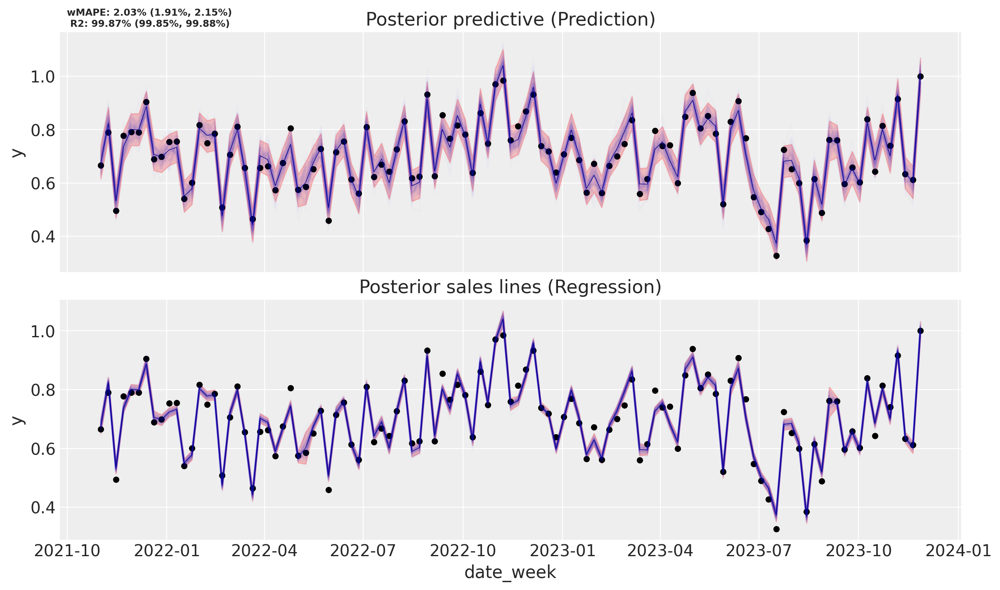

In [225]:

fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True)

# Muestras de las predicciones / posterior predictive
ax[0].plot(
    Y_scaled[mask]["date_week"],
    samples_pp,
    color="blue",
    alpha=0.01,
)
# Media de las predicciones / posterior predictive
ax[0].plot(
    Y_scaled[mask]["date_week"],
    avg_pp,
    color="darkblue",
    linewidth=.5
)
# HDIs de las predicciones / posterior predictive
ax[0].fill_between(
    Y_scaled[mask]["date_week"],
    hdi_pp[:, 0],
    hdi_pp[:, 1],
    color="red",
    alpha=0.2,
)
# Scatterplot datos reales
Y_scaled[mask].plot.scatter(x="date_week", y="y", color="k", ax=ax[0])
ax[0].set_title("Posterior predictive (Prediction)")

# Muestras de las regresiones / posterior
ax[1].plot(
    Y_scaled[mask]["date_week"],
    samples_p,
    color="blue",
    alpha=0.01,
)
# Media de las regresiones / posterior
ax[1].plot(
    Y_scaled[mask]["date_week"],
    avg_p,
    color="darkblue",
    linewidth=.5,
)
# HDIs de las regresiones / posterior
ax[1].fill_between(
    Y_scaled[mask]["date_week"],
    hdi_p[:, 0],
    hdi_p[:, 1],
    color="red",
    alpha=0.2,
)
# Scatterplot datos reales
Y_scaled[mask].plot.scatter(x="date_week", y="y", color="k", ax=ax[1])
ax[1].set_title("Posterior sales lines (Regression)")

# Add s_wMAPE and s_R2 as title of the figure
fig.suptitle(f"{s_wMAPE} {s_R2}", ha='left', x=0.0625, y=1, fontsize='small', fontweight='bold');
